
#Imports and local environment picture transfer

In [1]:
!pip install pytorch-lightning==2.0.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.6/715.6 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 31.3 MB/s eta 0:00:00


In [2]:
import os
import glob
import copy
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import KFold

import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset, random_split
from torchvision import models, transforms

import pytorch_lightning as pl
from torch.utils.tensorboard import SummaryWriter

from google.colab import drive
import shutil
import os
import shutil
import pandas as pd
import torch
import numpy as np
from torchvision import transforms
from collections import Counter

In [3]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Define the base source path on Google Drive
base_source_path = '/content/drive/My Drive/HW1 WS_DEEP/data'

# Define the source and destination paths for both folders
folders = ['sliced_test', 'sliced_train', 'big_trucks']

for folder in folders:
    source_path = os.path.join(base_source_path, folder)
    destination_path = f'/content/{folder}'

    # Check if the source folder exists
    if os.path.exists(source_path):
        # Copy the folder to the local runtime
        shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
        print(f"Folder '{folder}' copied successfully to {destination_path}")
    else:
        print(f"Source folder '{folder}' not found at {source_path}")

Folder 'sliced_test' copied successfully to /content/sliced_test
Folder 'sliced_train' copied successfully to /content/sliced_train
Folder 'big_trucks' copied successfully to /content/big_trucks


In [5]:
def copy_csv_files():
    # Define the base source path on Google Drive
    base_source_path = '/content/drive/My Drive/HW1 WS_DEEP/data'

    # Define the CSV file names
    csv_files = ['train_labels_and_bb.csv', 'test_labels_and_bb.csv']

    for file_name in csv_files:
        source_path = os.path.join(base_source_path, file_name)
        destination_path = f'/content/{file_name}'

        # Check if the source file exists
        if os.path.exists(source_path):
            # Copy the file to the local runtime
            shutil.copy2(source_path, destination_path)
            print(f"File '{file_name}' copied successfully to {destination_path}")

            # Load the CSV file using pandas
            df = pd.read_csv(destination_path)

            # Modify the 'class' column by subtracting 1 from each value
            if 'class' in df.columns:
                df['class'] = df['class'] - 1

                # Save the modified dataframe back to the CSV
                df.to_csv(destination_path, index=False)
                print(f"Updated 'class' column values and saved the file: {destination_path}")
            else:
                print(f"'class' column not found in {file_name}")
        else:
            print(f"Source file '{file_name}' not found at {source_path}")

copy_csv_files()


File 'train_labels_and_bb.csv' copied successfully to /content/train_labels_and_bb.csv
Updated 'class' column values and saved the file: /content/train_labels_and_bb.csv
File 'test_labels_and_bb.csv' copied successfully to /content/test_labels_and_bb.csv
Updated 'class' column values and saved the file: /content/test_labels_and_bb.csv


#slice the images

In [ ]:

# Step 2: Define paths
base_path = '/content/drive/MyDrive/HW1 WS_DEEP/data'
train_images_path = os.path.join(base_path, 'cars_train')
test_images_path = os.path.join(base_path, 'cars_test')
train_labels_path = os.path.join(base_path, 'train_labels_and_bb.csv')
test_labels_path = os.path.join(base_path, 'test_labels_and_bb.csv')
output_train_path = os.path.join(base_path, 'sliced_train')
output_test_path = os.path.join(base_path, 'sliced_test')

# Create output directories if they don't exist
os.makedirs(output_train_path, exist_ok=True)
os.makedirs(output_test_path, exist_ok=True)

# Step 3: Function to slice images based on bounding boxes
def slice_images(images_path, labels_path, output_path):
    # Read labels CSV
    labels = pd.read_csv(labels_path)

    for index, row in labels.iterrows():
        image_name = row['image'].strip("'")  # Strip single quotes from image name
        bbox = row[['x1', 'y1', 'x2', 'y2']].values  # Adjust based on your CSV structure

        # Construct full image path
        image_path = os.path.join(images_path, image_name)

        try:
            # Load image
            image = Image.open(image_path)

            # Slice image using bounding box
            sliced_image = image.crop((bbox[0], bbox[1], bbox[2], bbox[3]))

            # Save sliced image
            sliced_image.save(os.path.join(output_path, image_name))

        except FileNotFoundError:
            print(f"File {image_name} not found in {images_path}. Skipping...")
        except Exception as e:
            print(f"Error processing file {image_name}: {e}")

# Step 4: Process training and testing images
print("Processing training images...")
slice_images(train_images_path, train_labels_path, output_train_path)

print("Processing testing images...")
slice_images(test_images_path, test_labels_path, output_test_path)

print("Image slicing complete.")



#Question 1a

In [ ]:
base_source_path = '/content/drive/My Drive/HW1 WS_DEEP/data'

# Count images in train and test folders
train_path = os.path.join(base_source_path, "cars_train")
test_path = os.path.join(base_source_path, "cars_test")

train_count = len([f for f in os.listdir(train_path) if f.endswith(('.png', '.jpg', '.jpeg'))])
test_count = len([f for f in os.listdir(test_path) if f.endswith(('.png', '.jpg', '.jpeg'))])

print(f"Number of images in training folder: {train_count}")
print(f"Number of images in test folder: {test_count}")

# Load CSV files
train_labels_path = "/content/train_labels_and_bb.csv"
test_labels_path = "/content/test_labels_and_bb.csv"

train_labels_df = pd.read_csv(train_labels_path)
test_labels_df = pd.read_csv(test_labels_path)

# Combine the data and count unique classes
combined = pd.concat([train_labels_df, test_labels_df], ignore_index=True)
count = combined['class'].nunique()

print(f"Number of unique classes in the dataset is {count}")


Number of images in training folder: 8154
Number of images in test folder: 8041
Number of unique classes in the dataset is 196



#Question 1.b
Each sample contains:
- Image data (RGB channels, 3 dimensions)
- Bounding box coordinates for the car location
- Class label (out of 196 unique classes)

Data preprocessing needed:
- Resize images to consistent dimensions
- Extract car regions using provided bounding boxes
- Normalize pixel values

Data augmentation possibilities:
- Horizontal flips (valid since cars can be viewed from either side)
- Small rotations (within reason to maintain realism)
- Color jittering (brightness/contrast adjustments)
- Random crops within bounding box
Note: Must ensure augmentations maintain car visibility within bounding box

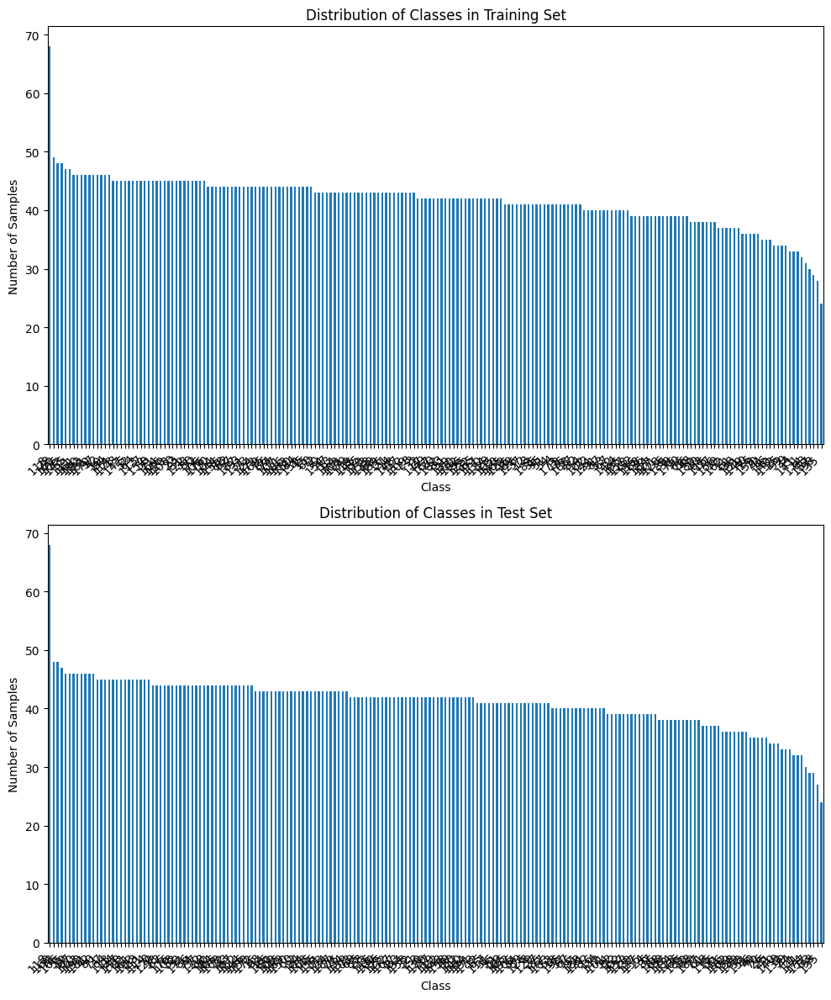

Training set class distribution:
Mean samples per class: 41.55
Min samples per class: 24
Max samples per class: 68

Test set class distribution:
Mean samples per class: 41.03
Min samples per class: 24
Max samples per class: 68


In [ ]:
import matplotlib.pyplot as plt
# Create separate counts for train and test datasets
train_class_counts = train_labels_df['class'].value_counts()
test_class_counts = test_labels_df['class'].value_counts()

# Create a figure with two subplots, one under the other
plt.figure(figsize=(10, 12))

# Plot training data distribution
plt.subplot(2, 1, 1)
train_class_counts.plot(kind='bar')
plt.title('Distribution of Classes in Training Set')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45, ha='right')

# Plot test data distribution
plt.subplot(2, 1, 2)
test_class_counts.plot(kind='bar')
plt.title('Distribution of Classes in Test Set')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

# Print some statistics
print(f"Training set class distribution:")
print(f"Mean samples per class: {train_class_counts.mean():.2f}")
print(f"Min samples per class: {train_class_counts.min()}")
print(f"Max samples per class: {train_class_counts.max()}")

print(f"\nTest set class distribution:")
print(f"Mean samples per class: {test_class_counts.mean():.2f}")
print(f"Min samples per class: {test_class_counts.min()}")
print(f"Max samples per class: {test_class_counts.max()}")


# 1.c Data Balance Analysis
Based on the class distribution statistics and visualizations, the dataset appears to be relatively balanced:

Training Set:
- Mean samples per class: 41.55
- Min samples per class: 24
- Max samples per class: 68

Test Set:
- Mean samples per class: 41.03
- Min samples per class: 24
- Max samples per class: 68

The distribution plots show that both training and test sets have a fairly uniform distribution
across classes, with only minor variations. While there is some imbalance between the minimum (24)
and maximum (68) samples per class, the mean around 41 samples indicates the data is reasonably
balanced overall.

#1.d
There are benchmark results available for various methods tested on this dataset:

1. **State-of-the-art results**: EfficientNet models, particularly the EfficientNet-B7 variant, have achieved impressive accuracy rates on the dataset. For instance, the Mish EfficientNet-B7 combined with the Ranger optimizer reached 94.79% accuracy in tests with multiple runs​ . This result is very close to the current state-of-the-art performance, which is around 96% using domain-adaptive transfer learning​


2. **Performance of Popular Architectures:** ResNet architectures like ResNet50 and ResNet152, along with DenseNet201, have also been widely used on the Stanford Cars dataset. These models typically yield accuracies between 85% and 90% when fine-tuned for this specific dataset​.
.

3.	**Limitations of Regular CNNs:**
Simpler CNN architectures, such as those with fewer layers or filters, often fail to generalize well on this dataset. Although these models may show low training loss and reasonable performance on validation data, their test accuracy is typically poor.
This discrepancy suggests that regular CNNs lack the capacity to capture the fine-grained and complex patterns required to differentiate between the highly similar car classes in the Stanford Cars dataset.
Observations from various implementations confirm that small or non-complex networks perform inadequately, struggling with overfitting despite achieving low training loss.


#Question 1.e

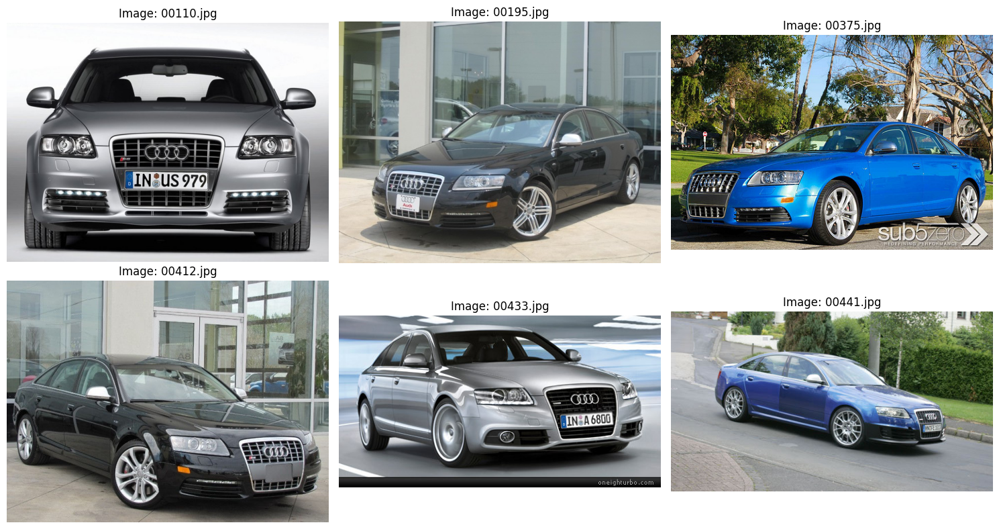


Filenames of displayed images:
00110.jpg
00195.jpg
00375.jpg
00412.jpg
00433.jpg
00441.jpg


In [ ]:
# Class ID to filter
class_id = 20

# Read the test labels CSV file
test_labels_path = os.path.join(base_source_path, 'test_labels_and_bb.csv')
test_labels_df = pd.read_csv(test_labels_path)

# Filter images for the specified class
class_images = test_labels_df[test_labels_df['class'] == class_id]

# Display first 6 images from this class
plt.figure(figsize=(15, 8))
for idx, (_, row) in enumerate(class_images.head(6).iterrows()):
    plt.subplot(2, 3, idx+1)
    # Construct the full image path
    img_path = os.path.join(base_source_path, 'cars_test', row['image'].strip("'"))
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"Image: {os.path.basename(img_path)}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# Print the filenames for reference
print("\nFilenames of displayed images:")
for _, row in class_images.head(6).iterrows():
    print(os.path.basename(row['image'].strip("'")))


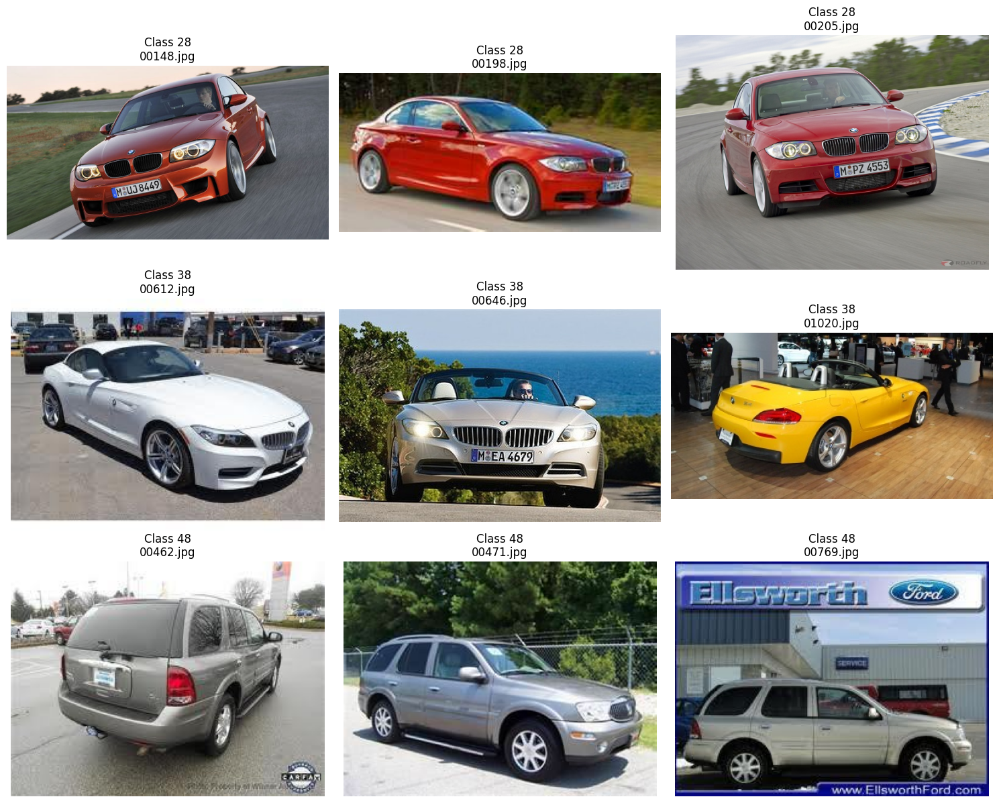


Filenames for displayed images:
Class 28:
["'00148.jpg'" "'00198.jpg'" "'00205.jpg'"]
Class 38:
["'00612.jpg'" "'00646.jpg'" "'01020.jpg'"]
Class 48:
["'00462.jpg'" "'00471.jpg'" "'00769.jpg'"]


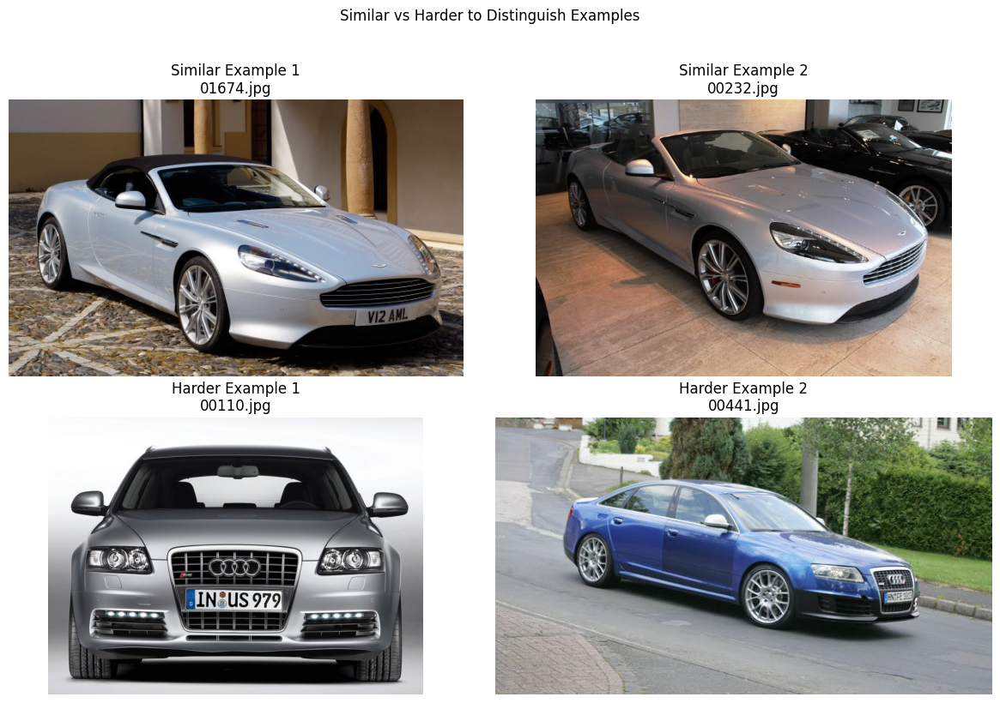


Class labels for similar and harder examples:
Image 01674.jpg: Class 10
Image 00232.jpg: Class 10
Image 00110.jpg: Class 20
Image 00441.jpg: Class 20


In [ ]:
# Define classes to display
class_ids = [28, 38, 48]

# Read the test labels CSV file
test_labels_path = os.path.join(base_source_path, 'test_labels_and_bb.csv')
test_labels_df = pd.read_csv(test_labels_path)

# Create a figure with three rows, one for each class
plt.figure(figsize=(15, 12))

for row, class_id in enumerate(class_ids):
    # Filter images for the current class
    class_images = test_labels_df[test_labels_df['class'] == class_id]

    # Display first 3 images from this class
    for col, (_, image_row) in enumerate(class_images.head(3).iterrows()):
        plt.subplot(3, 3, row * 3 + col + 1)
        img_path = os.path.join(base_source_path, 'cars_test', image_row['image'].strip("'"))
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title(f"Class {class_id}\n{os.path.basename(img_path)}")
        plt.axis('off')

plt.tight_layout()
plt.show()

# Print the filenames for reference
print("\nFilenames for displayed images:")
for class_id in class_ids:
    class_images = test_labels_df[test_labels_df['class'] == class_id]
    print(f"Class {class_id}:")
    print(class_images['image'].head(3).values)

# Display similar and harder to distinguish examples
# Define the image filenames
similar_images = ['01674.jpg', '00232.jpg']
harder_images = ['00110.jpg', '00441.jpg']

# Create a figure with two rows
plt.figure(figsize=(12, 8))

# Plot similar images
for idx, img_name in enumerate(similar_images):
    plt.subplot(2, 2, idx+1)
    img_path = os.path.join(base_source_path, 'cars_test', img_name)
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"Similar Example {idx+1}\n{img_name}")
    plt.axis('off')

# Plot harder images
for idx, img_name in enumerate(harder_images):
    plt.subplot(2, 2, idx+3)
    img_path = os.path.join(base_source_path, 'cars_test', img_name)
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"Harder Example {idx+1}\n{img_name}")
    plt.axis('off')

plt.suptitle("Similar vs Harder to Distinguish Examples", y=1.02)
plt.tight_layout()
plt.show()

# Print the class labels for each image
print("\nClass labels for similar and harder examples:")
for img_name in similar_images + harder_images:
    class_id = test_labels_df[test_labels_df['image'].str.contains(img_name)]['class'].values[0]
    print(f"Image {img_name}: Class {class_id}")



#Question 2
Form a neural network graph based on the components we used in the walkthroughs in class.
Use KFold cross validation )K>=5) to measure model performance and comparisons of different settings as described below
a.	Fit your model to the data and analyze the results (Use visualizations to present your loss and other metrics you find relevant, show examples for good and bad classification with high probability, and refer to the uncertain predictions.  
Compare the results you got on the training data vs. your results for the validation/test data)
Present the validation and test metrics for each fold and compare them to the test result achieved from mean of all folds prediction


In [ ]:
batch_size = 64
BATCH_SIZE = 128
MAX_EPOCHS = 15
K=5

# Define paths
train_csv = 'train_labels_and_bb.csv'
test_csv = 'test_labels_and_bb.csv'
train_images_path = '/content/sliced_train'
test_images_path = '/content/sliced_test'


# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),      # Convert image to PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1] for 3 channels
    ])


class CustomImageDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data_frame.iloc[idx, self.data_frame.columns.get_loc('image')].strip("'"))
        image = Image.open(img_name).convert('RGB')  # Convert image to RGB
        label = self.data_frame.iloc[idx, self.data_frame.columns.get_loc('class')]


        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label,dtype=torch.long)


In [ ]:
# Create datasets
train_dataset = CustomImageDataset(csv_file=train_csv, root_dir=train_images_path, transform=transform)
test_dataset = CustomImageDataset(csv_file=test_csv, root_dir=test_images_path)

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

#2.a base line model and cross validation

In [ ]:
# Define CNN model instead of a simple MLP
class CARS_BASE_CNN(pl.LightningModule):
  def __init__(self):
    super().__init__()
      # Define a simple CNN architecture with all strides set to 1
    self.conv_layers = nn.Sequential(
          nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),  # 3 input channels (RGB)
          nn.BatchNorm2d(16),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),  # Using stride=1 to avoid size reduction

          nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(32),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),  # Using stride=1 to avoid size reduction

          nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(64),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),  # Using stride=1 to avoid size reduction

          nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(128),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),  # Using stride=1 to avoid size reduction

          nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(256),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2)  # Using stride=1 to avoid size reduction)
          )
      # Fully connected layers after convolutions
    self.fc_layers = nn.Sequential(
          nn.Linear(12544, 8192),  # Correct input size based on the flattened size after conv layers
          nn.BatchNorm1d(8192),  # Batch Normalization for stable training
          nn.ReLU(),
          nn.Dropout(0.5),  # Dropout with a rate of 0.5

          nn.Linear(8192, 1024),
          nn.BatchNorm1d(1024),  # Batch Normalization
          nn.ReLU(),
          nn.Dropout(0.4),  # Dropout with a rate of 0.4

          nn.Linear(1024, 512),
          nn.BatchNorm1d(512),  # Batch Normalization
          nn.ReLU(),
          nn.Dropout(0.3),  # Dropout with a rate of 0.3

          nn.Linear(512, 256),
          nn.BatchNorm1d(256),  # Batch Normalization
          nn.ReLU(),
          nn.Dropout(0.3),  # Dropout with a rate of 0.3

          nn.Linear(256, 196)  # Output size for the number of classes
          )



  def forward(self, x):
    x = self.conv_layers(x)
    # print("Shape after convolution and pooling:", x.shape)  # Print the shape
    x = x.view(x.size(0), -1)  # Flatten the output from conv layers
    # print("Flattened size:", x.shape)  # Optional: Print the flattened shape
    x = self.fc_layers(x)
    return x


  def training_step(self, batch):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy
    self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
    self.log('train_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
    return loss

  def test_step(self, batch, batch_nb):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy
    self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
    self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
    return loss

  def validation_step(self, batch, batch_nb):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy

    self.log('val_loss_epoch', loss, on_epoch=True, prog_bar=True, logger=True)
    self.log('val_acc_epoch', acc, on_epoch=True, prog_bar=True, logger=True)

    return loss

  def configure_optimizers(self):
    # Increase learning rate as requested
    optimizer = optim.Adam(self.parameters(), lr=5e-4)  # Learning rate increased to 0.0005
    return optimizer


cross validation functions:

In [ ]:
class MetricsLoggerCallback(pl.Callback):
    """
    Callback to log and store metrics after each epoch for training and validation.
    """
    def __init__(self):
        super().__init__()
        self.fold_metrics = []

    def on_fit_start(self, trainer, pl_module):
        # Reset metrics storage for the current fold
        self.current_fold_metrics = {
            'train_loss': [],
            'train_acc': [],
            'val_loss': [],
            'val_acc': []
        }

    def on_train_epoch_end(self, trainer, pl_module):
        # Retrieve metrics at the end of the training epoch
        metrics = trainer.callback_metrics
        if 'train_loss' in metrics:
            self.current_fold_metrics['train_loss'].append(metrics['train_loss'].item())
        if 'train_acc' in metrics:
            self.current_fold_metrics['train_acc'].append(metrics['train_acc'].item())

    def on_validation_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        if 'val_loss_epoch' in metrics:
            self.current_fold_metrics['val_loss'].append(metrics['val_loss_epoch'].item())
        if 'val_acc_epoch' in metrics:
            self.current_fold_metrics['val_acc'].append(metrics['val_acc_epoch'].item())

    def on_fit_end(self, trainer, pl_module):
        # Store the metrics for the completed fold
        self.fold_metrics.append(copy.deepcopy(self.current_fold_metrics))


def cross_validate(model_class, dataset, test_dataset, k=K, max_epochs=MAX_EPOCHS, batch_size=BATCH_SIZE, num_workers=8):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    # Callback to log metrics
    metrics_callback = MetricsLoggerCallback()

    all_metrics = []
    test_loss_all = []
    test_acc_all = []

    # Perform K-fold cross-validation
    for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
        print(f"===== Starting Fold {fold+1}/{k} =====")

        # Create train and validation subsets
        train_subset = Subset(dataset, train_idx)
        val_subset = Subset(dataset, val_idx)

        # Create dataloaders for the current fold
        train_dl = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
        val_dl = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
        test_dl = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

        # Initialize model
        model = model_class()

        # Trainer for the current fold
        trainer = pl.Trainer(
            max_epochs=max_epochs,
            callbacks=[metrics_callback],
            logger=False,
            enable_checkpointing=False,
            num_sanity_val_steps=0  # Disable sanity check for alignment of metrics
        )

        # Fit the model on this fold's data
        trainer.fit(model, train_dataloaders=train_dl, val_dataloaders=val_dl)

        # Test the model on the test dataset
        test_metrics = trainer.test(model, test_dl)
        test_loss_fold = test_metrics[0]['test_loss']
        test_acc_fold = test_metrics[0]['test_acc']

        test_loss_all.append(test_loss_fold)
        test_acc_all.append(test_acc_fold)

        # Retrieve fold metrics from the callback
        fold_metrics = metrics_callback.fold_metrics[-1]

        # Since test is run after training, we only have one set of test metrics (final),
        # but we will replicate it across all epochs for plotting consistency.
        fold_metrics['test_loss'] = [test_loss_fold] * len(fold_metrics['train_loss'])
        fold_metrics['test_acc'] = [test_acc_fold] * len(fold_metrics['train_acc'])

        all_metrics.append(fold_metrics)
        print(f"===== Fold {fold+1}/{k} Complete =====")

    return all_metrics, test_loss_all, test_acc_all

In [ ]:
def plot_cross_validation_results(all_metrics, test_loss_all, test_acc_all):
    # Plot metrics for each fold
    for fold_idx, fold_metrics in enumerate(all_metrics):
        epochs = range(1, len(fold_metrics['train_loss']) + 1)

        plt.figure(figsize=(14, 6))

        # Loss plot
        plt.subplot(1, 2, 1)
        plt.plot(epochs, fold_metrics['train_loss'], label='Train Loss')
        plt.plot(epochs, fold_metrics['val_loss'], label='Val Loss')
        plt.plot(epochs, fold_metrics['test_loss'], label='Test Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title(f'Fold {fold_idx+1} Loss')
        plt.legend()

        # Accuracy plot
        plt.subplot(1, 2, 2)
        plt.plot(epochs, fold_metrics['train_acc'], label='Train Accuracy')
        plt.plot(epochs, fold_metrics['val_acc'], label='Val Accuracy')
        plt.plot(epochs, fold_metrics['test_acc'], label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.title(f'Fold {fold_idx+1} Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()

    # Compute and plot the mean accuracy across folds
    # Assuming all folds have the same number of epochs
    num_epochs = len(all_metrics[0]['train_acc'])

    # Stack all folds' metrics and average
    mean_train_acc = np.mean([m['train_acc'] for m in all_metrics], axis=0)
    mean_val_acc   = np.mean([m['val_acc'] for m in all_metrics], axis=0)
    mean_test_acc  = np.mean([m['test_acc'] for m in all_metrics], axis=0)

    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(7, 5))
    plt.plot(epochs, mean_train_acc, label='Mean Train Accuracy', marker='o')
    plt.plot(epochs, mean_val_acc, label='Mean Val Accuracy', marker='o')
    plt.plot(epochs, mean_test_acc, label='Mean Test Accuracy', marker='o')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Mean Accuracy Across Folds')
    plt.legend()
    plt.grid(True)
    plt.show()



===== Starting Fold 1/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('val_loss_epoch', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('val_acc_epoch', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.20333291590213776    │
│         test_loss         │     3.633082628250122     │
└───────────────────────────┴───────────────────────────┘

===== Starting Fold 2/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.24039298295974731    │
│         test_loss         │    3.3539726734161377     │
└───────────────────────────┴───────────────────────────┘

===== Starting Fold 3/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.2449944019317627     │
│         test_loss         │     3.33691143989563      │
└───────────────────────────┴───────────────────────────┘

===== Starting Fold 4/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.23840318620204926    │
│         test_loss         │    3.4345667362213135     │
└───────────────────────────┴───────────────────────────┘

===== Starting Fold 5/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.23380176723003387    │
│         test_loss         │    3.4302639961242676     │
└───────────────────────────┴───────────────────────────┘

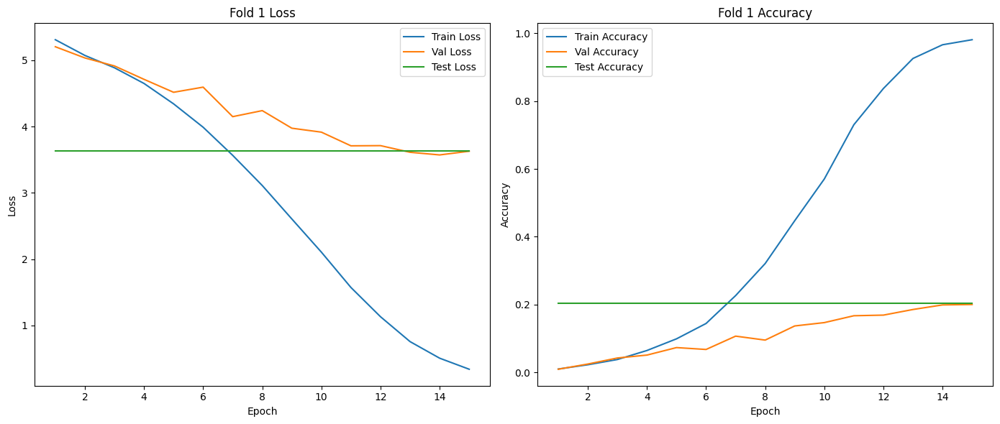

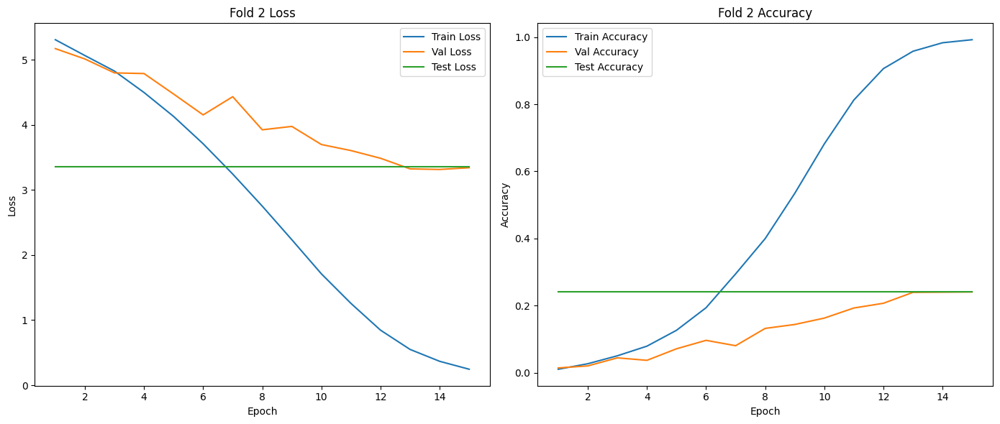

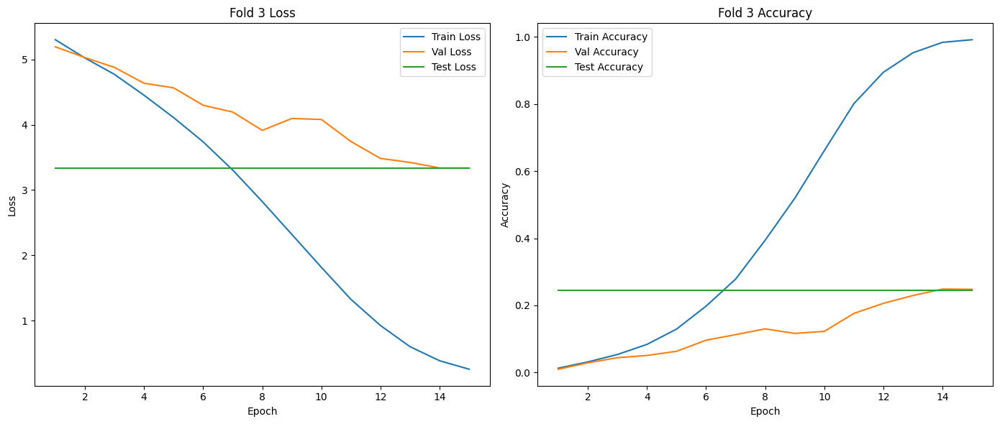

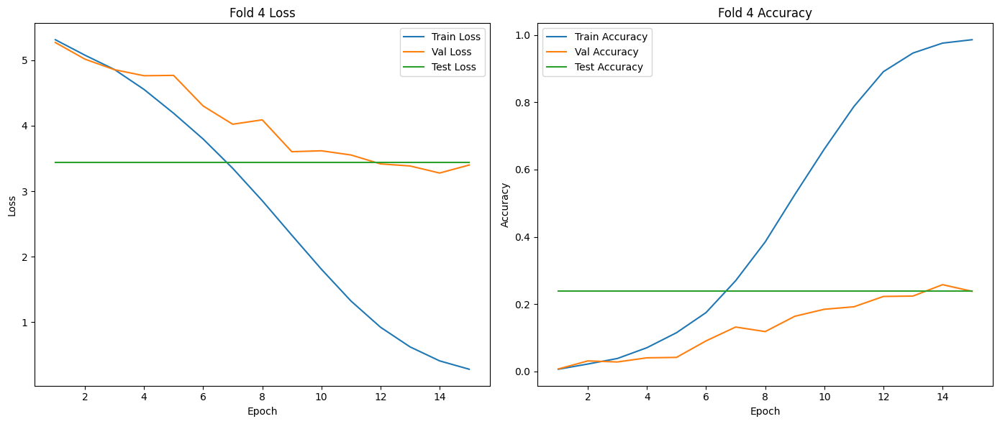

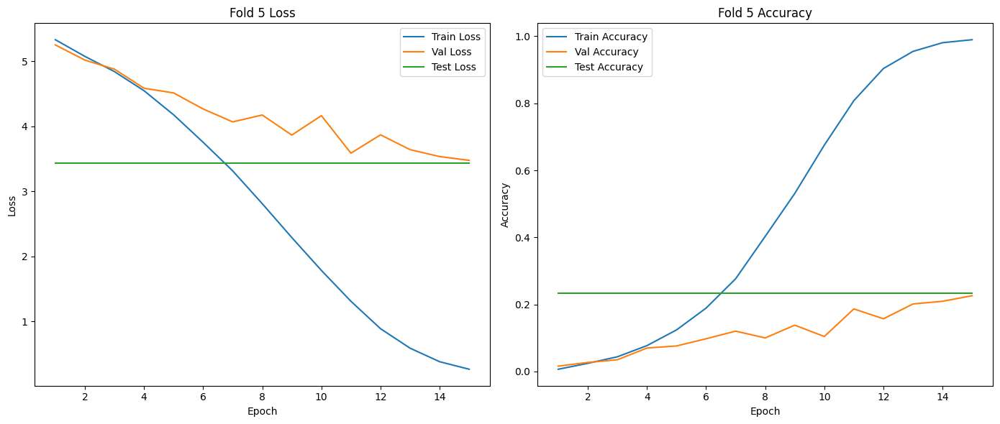

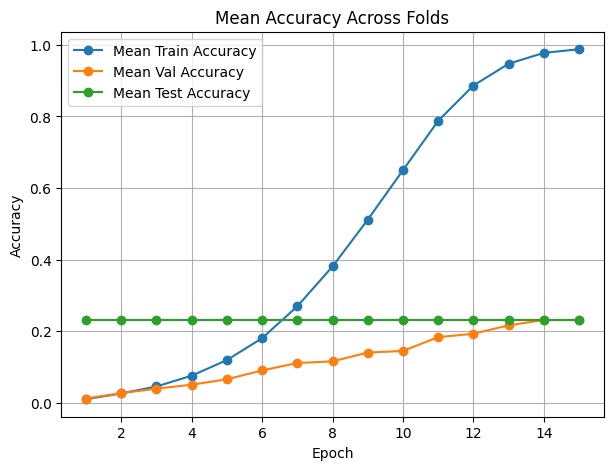

In [ ]:
base_all_metrics, base_test_loss_all, base_test_acc_all = cross_validate(CARS_BASE_CNN, train_dataset, test_dataset, k=K, max_epochs=MAX_EPOCHS, batch_size=BATCH_SIZE)
plot_cross_validation_results(base_all_metrics, base_test_loss_all, base_test_acc_all)

#2.b why is the model misclassifying & improvment suggustions




Ambiguous Features: The model may struggle with classes that share similar features, leading to confusion and incorrect classifications. Analyzing the misclassified examples to identify patterns, such as visual similarity between classes, can provide insights.

Dataset Quality: Low-quality images, mislabeled examples, or noise in the dataset can contribute to misclassification. It is important to examine the dataset for inconsistencies that may negatively impact model performance.

In [ ]:
#general model for finding hard cllasification for it
carsBaseLine_model = CARS_BASE_CNN()

# Set up the Trainer
trainer = pl.Trainer(
    accelerator='auto',
    devices=1,  # Use one GPU
    max_epochs=MAX_EPOCHS  # Train for 10 epochs
)

# Train and test the model
trainer.fit(carsBaseLine_model, train_dataloader)
trainer.test(carsBaseLine_model, test_dataloader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/configuration_validator.py:72: PossibleUserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn(
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 393 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.113   Total estimated model params size (

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.2942420244216919     │
│         test_loss         │    3.2606751918792725     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 3.2606751918792725, 'test_acc': 0.2942420244216919}]

sampeling miss classified cars:

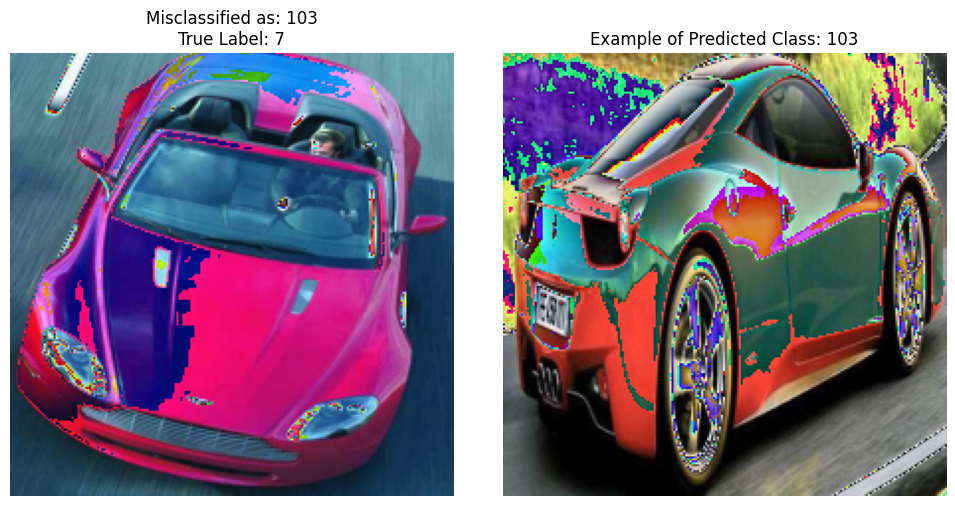

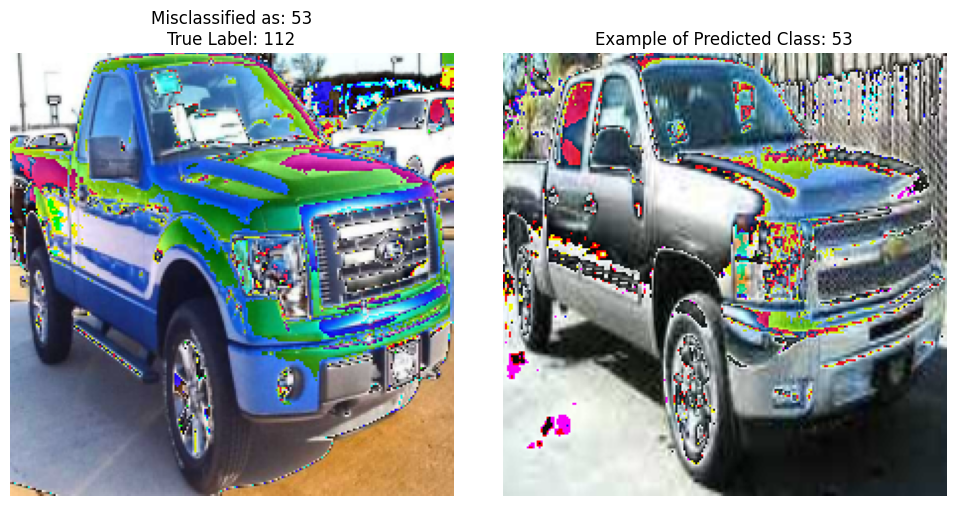

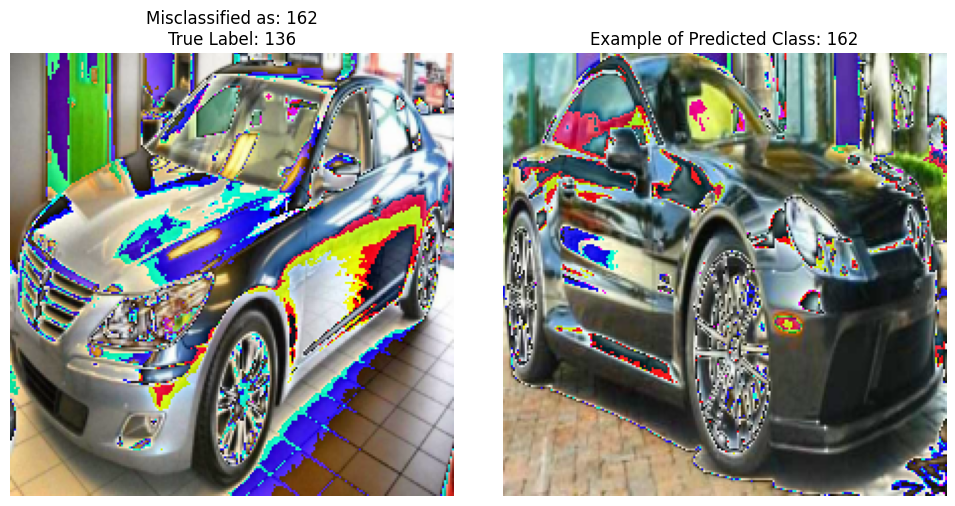

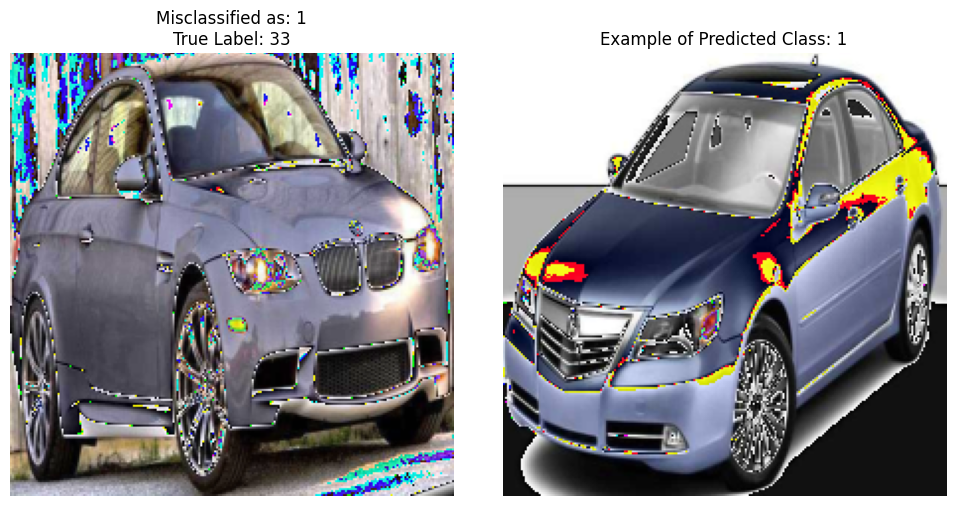

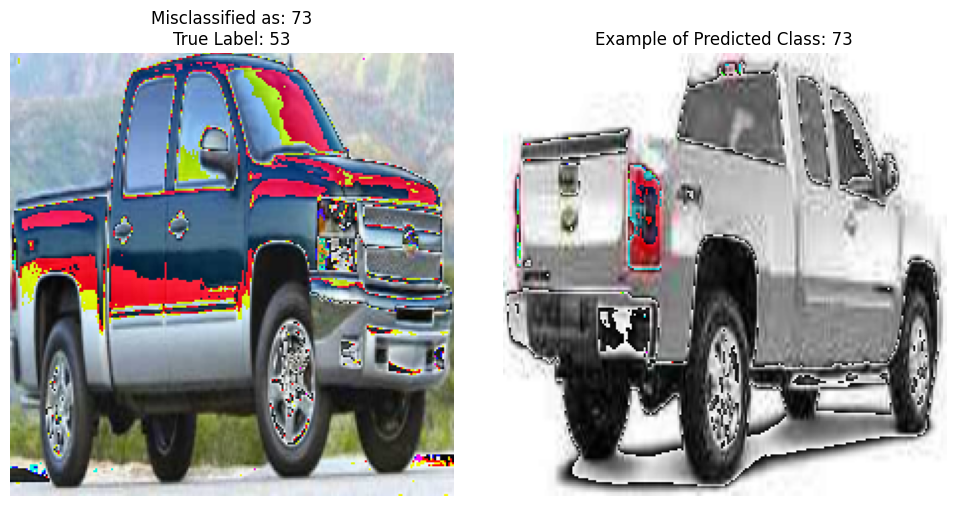

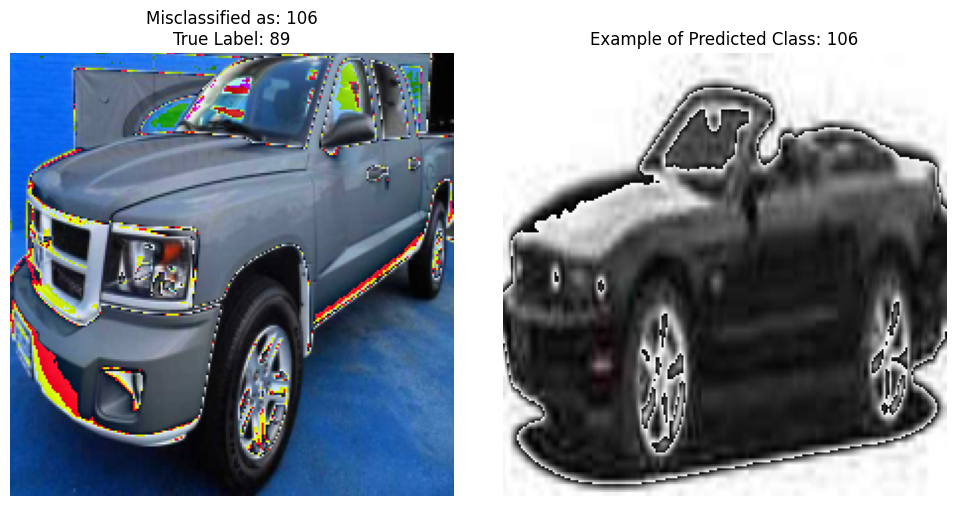

In [ ]:
# Assuming test_dataset is already created and loaded
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Ensure the model is in evaluation mode
carsBaseLine_model.eval()

# Set up a transform to convert the tensor to a PIL image for visualization
to_pil = transforms.ToPILImage()

misclassified_samples = []

# Go through the test dataset and collect misclassified samples
with torch.no_grad():
    for images, labels in test_dataloader:
        outputs = carsBaseLine_model(images)
        _, predicted = torch.max(outputs, 1)

        # Find indices of misclassified images
        misclassified_indices = (predicted != labels).nonzero(as_tuple=True)[0]

        # Store misclassified samples with image, true label, and predicted label
        for idx in misclassified_indices:
            misclassified_samples.append((images[idx], labels[idx].item(), predicted[idx].item()))

# Randomly select 4-6 misclassified examples to display
selected_misclassified = random.sample(misclassified_samples, min(6, len(misclassified_samples)))

# Plot each misclassified image alongside an example of the predicted class
for i, (image, true_label, predicted_label) in enumerate(selected_misclassified):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the misclassified image
    axs[0].imshow(to_pil(image))
    axs[0].set_title(f"Misclassified as: {predicted_label}\nTrue Label: {true_label}")
    axs[0].axis('off')

    # Find an example image of the predicted class from the dataset
    reference_image = None
    for img, label in test_dataset:
        if label == predicted_label:
            reference_image = img
            break

    if reference_image is not None:
        axs[1].imshow(to_pil(reference_image))
        axs[1].set_title(f"Example of Predicted Class: {predicted_label}")
    else:
        axs[1].text(0.5, 0.5, "No Example Found", horizontalalignment='center', verticalalignment='center', fontsize=12)
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()


#2.c improvment implementation

In [6]:
BATCH_SIZE = 128
MAX_EPOCHS = 25
K=5

# Define paths
train_csv = 'train_labels_and_bb.csv'
test_csv = 'test_labels_and_bb.csv'
train_images_path = '/content/sliced_train'
test_images_path = '/content/sliced_test'


# Define transformations
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(10),  # Randomly rotate the image by up to 10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Random changes in brightness, contrast, saturation, and hue
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1] for 3 channels
])
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),        # Convert image to PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1] for 3 channels
    ])

class CustomImageDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data_frame.iloc[idx, self.data_frame.columns.get_loc('image')].strip("'"))
        image = Image.open(img_name).convert('RGB')  # Convert image to RGB
        label = self.data_frame.iloc[idx, self.data_frame.columns.get_loc('class')]


        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label,dtype=torch.long)


In [7]:
# Create datasets
train_dataset = CustomImageDataset(csv_file=train_csv, root_dir=train_images_path, transform=train_transform)
test_dataset = CustomImageDataset(csv_file=test_csv, root_dir=test_images_path, transform=test_transform)

# Define the split sizes
val_split = int(0.2 * len(train_dataset))  # 20% for validation
train_split = len(train_dataset) - val_split

# Perform the split
train_data, val_data = random_split(train_dataset, [train_split, val_split])

# Create DataLoaders for training and validation
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)

In [8]:
# Define CNN model with Regularization Techniques
class CARS_IMPROVED_CNN(pl.LightningModule):
  def __init__(self):
    super().__init__()
    # Define a simple CNN architecture with all strides set to 1
    self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),  # Initial Conv Layer
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # First residual block
            nn.Sequential(
                nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(32),
                nn.ReLU(),
                nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(32)
            ),
            nn.ReLU(),  # Apply ReLU to the sum of input and block output

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second inline residual block
            nn.Sequential(
                nn.Conv2d(64, 64, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                nn.Conv2d(64, 64, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(64)
            ),
            nn.ReLU(),  # Apply ReLU to the sum of input and block output

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
            )
    # Fully connected layers after convolutions
    self.fc_layers = nn.Sequential(
            nn.Linear(256 * 7 * 7, 8192),  # Adjust input size based on final feature map size
            nn.BatchNorm1d(8192),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(8192, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.4),

            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(256, 196)  # Output size for 196 classes
            )

  def forward(self, x):
    x = self.conv_layers(x)
    x = x.view(x.size(0), -1)  # Flatten the output from conv layers
    x = self.fc_layers(x)
    return x

  def training_step(self, batch, batch_nb):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy

    # Apply L2 regularization without in-place operation
    l2_lambda = 1e-4
    l2_reg = torch.tensor(0., requires_grad=True).to(self.device)
    for param in self.parameters():
        l2_reg = l2_reg + torch.norm(param, 2)
    loss = loss + l2_lambda * l2_reg

    self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
    self.log('train_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
    return loss


  def test_step(self, batch, batch_nb):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy
    self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
    self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
    return loss

  def configure_optimizers(self):
    optimizer = optim.Adam(self.parameters(), lr=5e-4, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)
    return {
        'optimizer': optimizer,
        'lr_scheduler': scheduler,
        'monitor': 'val_loss_epoch'  # The metric the scheduler should monitor
    }

  def validation_step(self, batch, batch_idx):
    X, y = batch
    output = self(X)
    loss = F.cross_entropy(output, y)
    acc = (output.argmax(dim=1) == y).float().mean()
    self.log('val_loss_epoch', loss, on_epoch=True, prog_bar=True, logger=True)
    self.log('val_acc_epoch', acc, on_epoch=True, prog_bar=True, logger=True)
    return loss






improved model cross validation

In [ ]:
improved_all_metrics, improved_test_loss_all, improved_test_acc_all = cross_validate(CARS_IMPROVED_CNN, train_dataset, test_dataset, k=K, max_epochs=MAX_EPOCHS, batch_size=BATCH_SIZE)


===== Starting Fold 1/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('train_acc', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('val_loss_epoch', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('val_acc_epoch', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('test_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/core/module.py:482: UserWarning: You called `self.log('test_acc', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
  rank_zero_warn(


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4296729266643524     │
│         test_loss         │    2.2526662349700928     │
└───────────────────────────┴───────────────────────────┘

===== Fold 1/5 Complete =====
===== Starting Fold 2/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4386270344257355     │
│         test_loss         │     2.181924343109131     │
└───────────────────────────┴───────────────────────────┘

===== Fold 2/5 Complete =====
===== Starting Fold 3/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.43303072452545166    │
│         test_loss         │    2.2126588821411133     │
└───────────────────────────┴───────────────────────────┘

===== Fold 3/5 Complete =====
===== Starting Fold 4/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4176097512245178     │
│         test_loss         │    2.2427656650543213     │
└───────────────────────────┴───────────────────────────┘

===== Fold 4/5 Complete =====
===== Starting Fold 5/5 =====


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4396219253540039     │
│         test_loss         │    2.1745195388793945     │
└───────────────────────────┴───────────────────────────┘

===== Fold 5/5 Complete =====


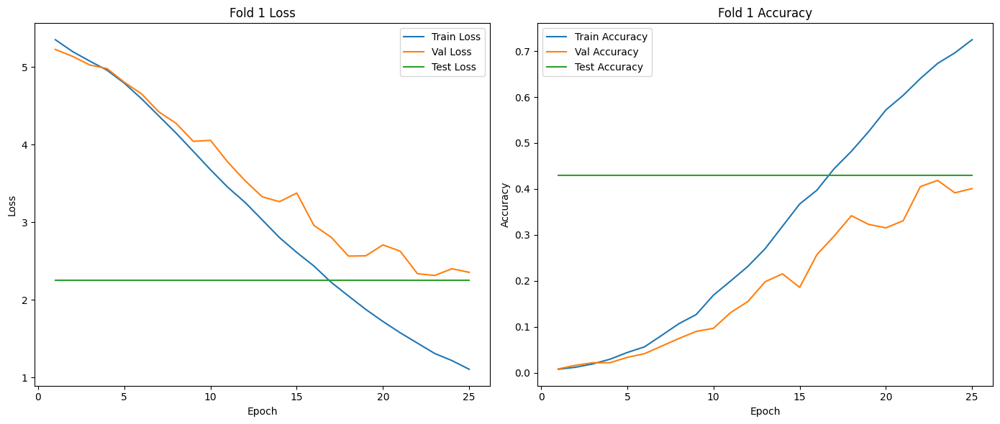

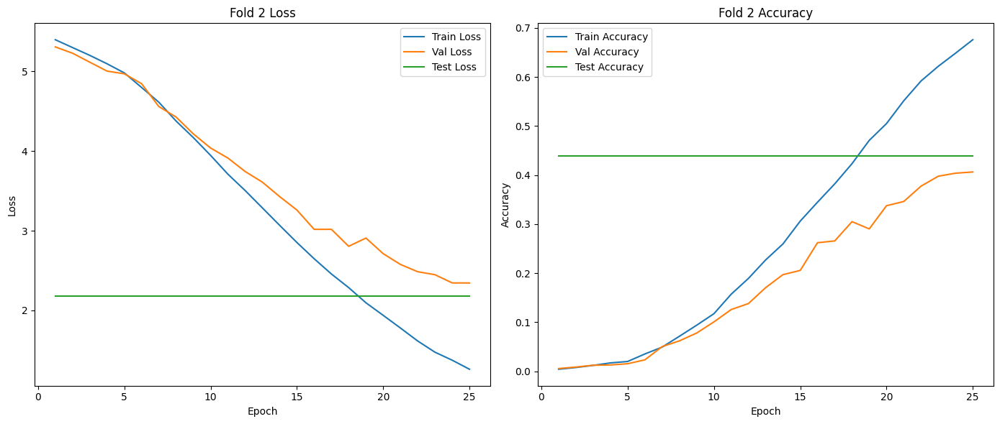

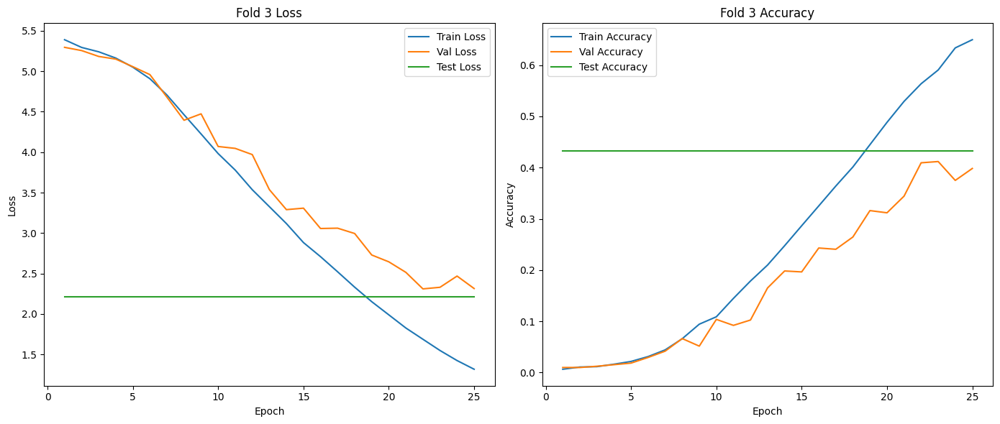

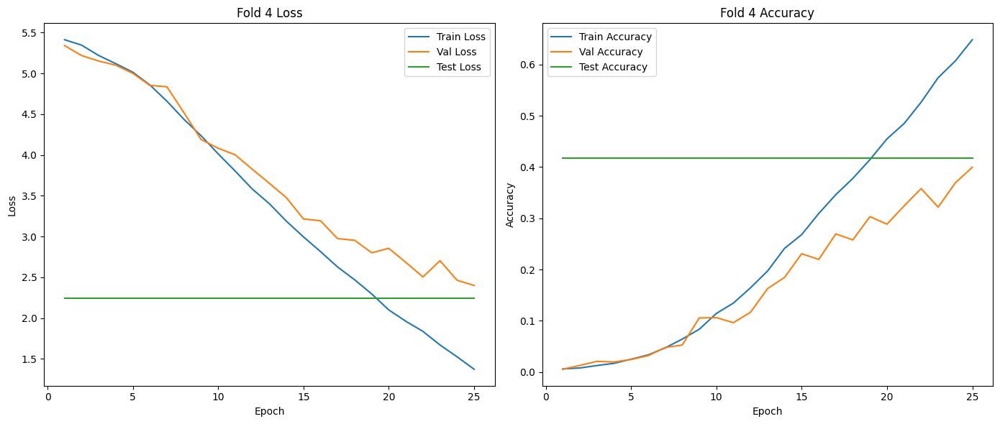

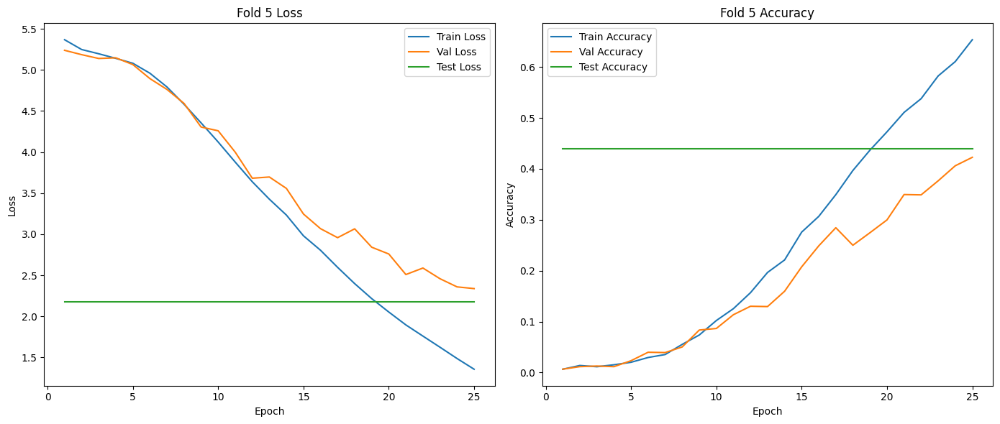

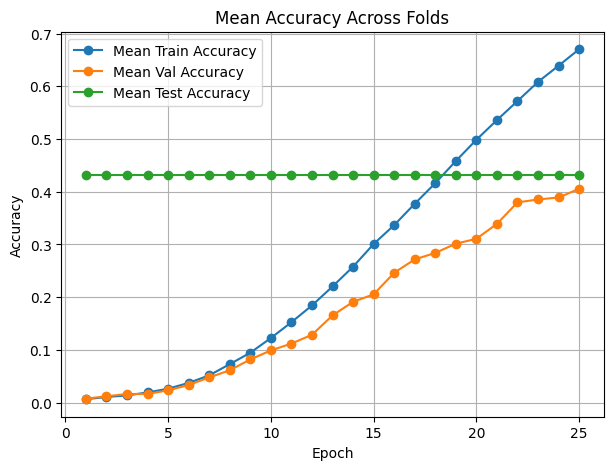

In [ ]:
plot_cross_validation_results(improved_all_metrics, improved_test_loss_all, improved_test_acc_all)


final model with all training samples

# 2.b.2 missed cllasified pictures on new model


In [ ]:
# Initialize the model
carsimproved_model = CARS_IMPROVED_CNN()

# Set up the Trainer
trainer = pl.Trainer(
    accelerator='auto',
    devices=1,  # Use one GPU
    max_epochs=MAX_EPOCHS
)

# Train the model with training and validation datasets
trainer.fit(carsimproved_model, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)
trainer.test(carsimproved_model, test_dataloader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.484   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.454296737909317     │
│         test_loss         │    2.0890305042266846     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.0890305042266846, 'test_acc': 0.454296737909317}]

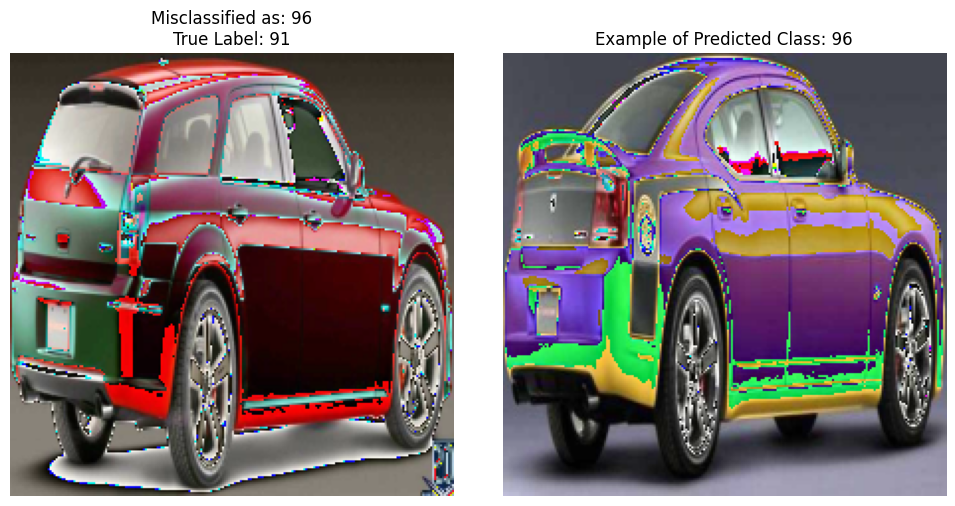

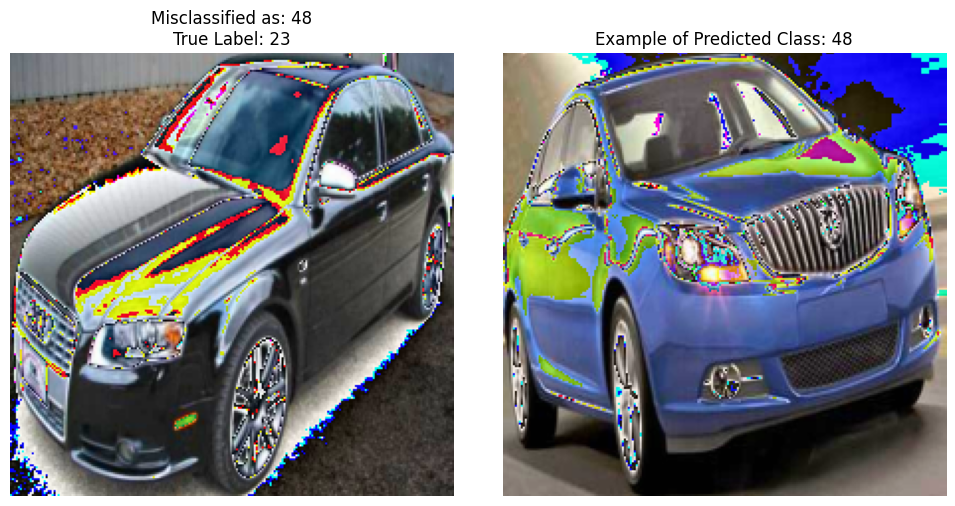

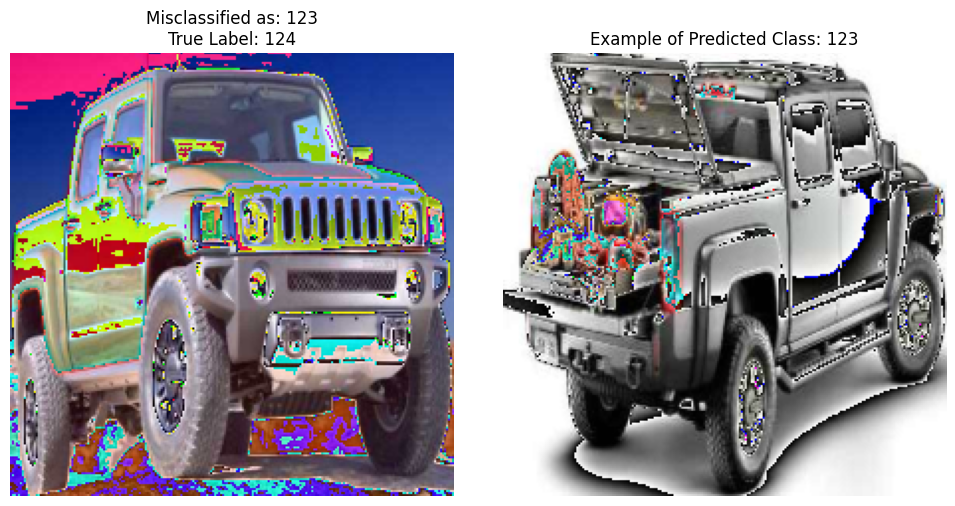

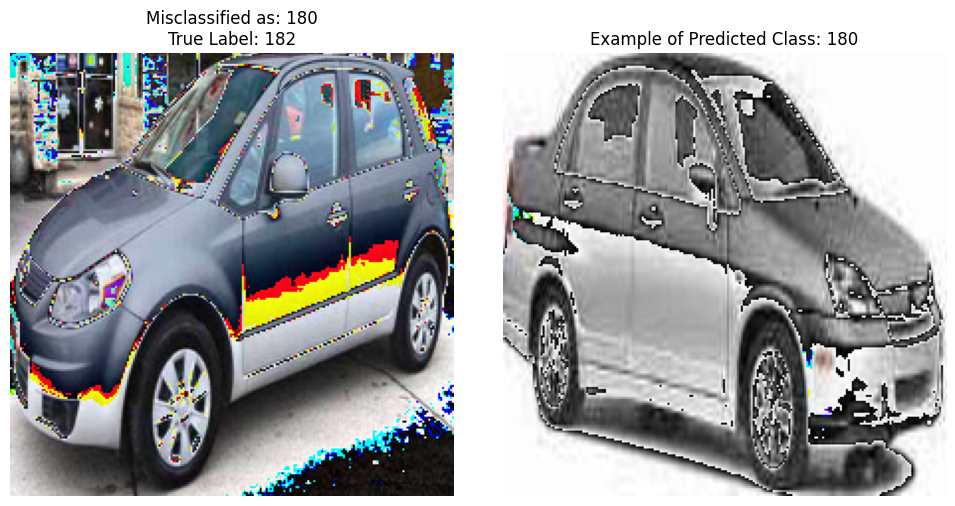

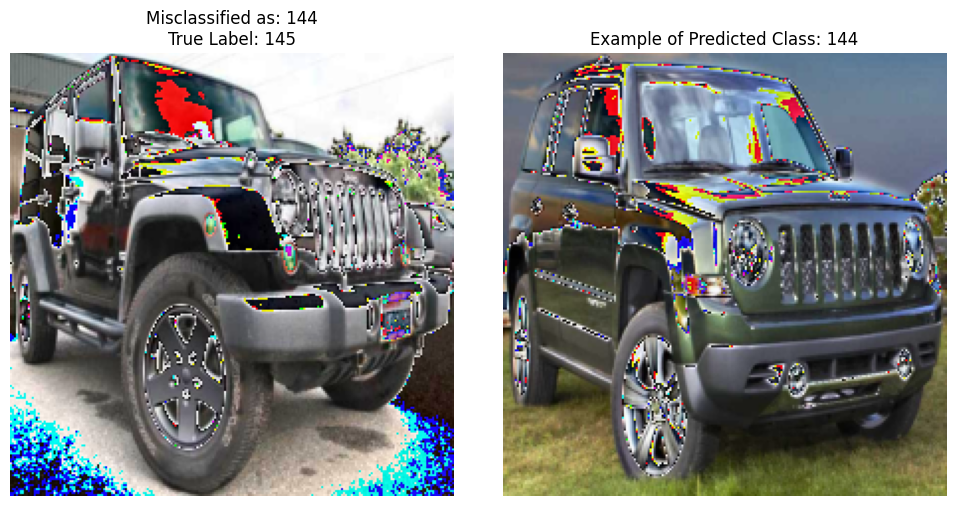

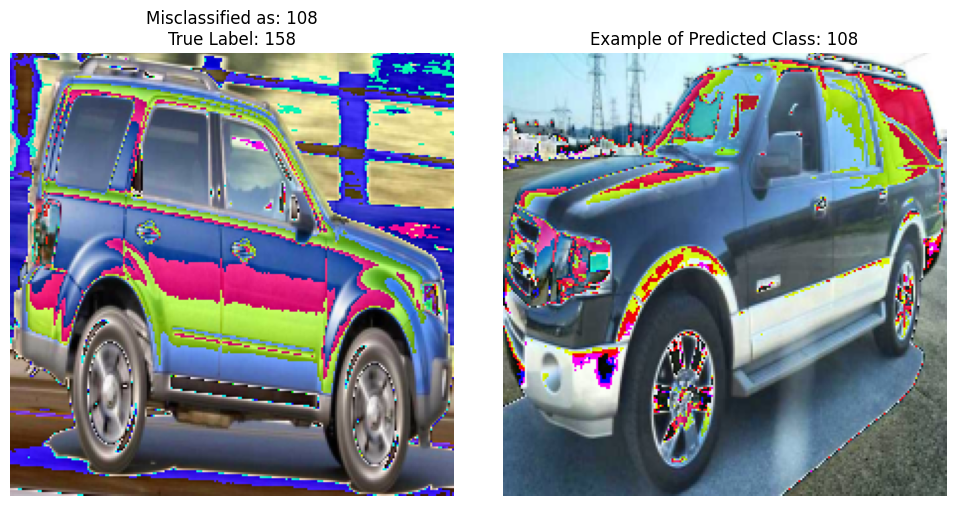

In [ ]:
# Ensure the model is on the GPU and in evaluation mode
carsimproved_model.to('cuda')
carsimproved_model.eval()

# Set up a transform to convert the tensor to a PIL image for visualization
to_pil = transforms.ToPILImage()

misclassified_samples = []

# Go through the test dataset and collect misclassified samples
with torch.no_grad():
    for images, labels in test_dataloader:
        images, labels = images.to('cuda'), labels.to('cuda')
        outputs = carsimproved_model(images)
        _, predicted = torch.max(outputs, 1)

        # Find indices of misclassified images
        misclassified_indices = (predicted != labels).nonzero(as_tuple=True)[0]

        # Store misclassified samples with image, true label, and predicted label
        for idx in misclassified_indices:
            misclassified_samples.append((images[idx].cpu(), labels[idx].item(), predicted[idx].item()))

# Randomly select 4-6 misclassified examples to display
selected_misclassified = random.sample(misclassified_samples, min(6, len(misclassified_samples)))

# Plot each misclassified image alongside an example of the predicted class
for i, (image, true_label, predicted_label) in enumerate(selected_misclassified):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the misclassified image
    axs[0].imshow(to_pil(image))
    axs[0].set_title(f"Misclassified as: {predicted_label}\nTrue Label: {true_label}")
    axs[0].axis('off')

    # Find an example image of the predicted class from the dataset
    reference_image = None
    for img, label in test_dataset:
        if label == predicted_label:
            reference_image = img
            break

    if reference_image is not None:
        axs[1].imshow(to_pil(reference_image))
        axs[1].set_title(f"Example of Predicted Class: {predicted_label}")
    else:
        axs[1].text(0.5, 0.5, "No Example Found", horizontalalignment='center', verticalalignment='center', fontsize=12)
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()


#2.d inference-time-augmentation

In [ ]:
def inference_time_augmentation(model, test_dataset, num_augmentations=10):
    """
    Perform inference-time augmentation and predict the most common class.

    Args:
        model: Trained PyTorch model (e.g., carsimproved_model).
        test_dataset: Dataset object containing test images.
        num_augmentations: Number of augmentations to apply to each test image.

    Returns:
        A list of final predictions for the test dataset.
    """
    model.eval()  # Ensure the model is in evaluation mode
    model.to('cuda')  # Move the model to GPU if available

    # Define augmentations to apply during inference
    augmentation_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(5),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    # To store final predictions
    final_predictions = []

    # Iterate through the test dataset
    for idx in range(len(test_dataset)):
        image, _ = test_dataset[idx]  # Load the test image

        # Apply augmentations and collect predictions
        augmented_images = []
        for _ in range(num_augmentations):
            # Apply augmentation and normalize
            augmented_image = augmentation_transform(image)
            augmented_images.append(augmented_image)

        # Stack augmented images and move to GPU
        augmented_images = torch.stack(augmented_images).to('cuda')

        with torch.no_grad():
            # Make predictions on all augmented images
            outputs = model(augmented_images)
            predicted_classes = outputs.argmax(dim=1).cpu().numpy()  # Get predicted classes

        # Aggregate predictions using the most common class
        most_common_class = Counter(predicted_classes).most_common(1)[0][0]
        final_predictions.append(most_common_class)

    return final_predictions


In [ ]:
def calculate_accuracy(predictions, test_dataset):
    correct = 0
    total = len(test_dataset)

    # Iterate through the test dataset to compare predictions with ground truth
    for i, (_, true_label) in enumerate(test_dataset):
        if predictions[i] == true_label:
            correct += 1

    accuracy = correct / total
    return accuracy

final_preds = inference_time_augmentation(carsimproved_model, test_dataset, 25)
accuracy = calculate_accuracy(final_preds, test_dataset)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 19.80%


# 2.e new category added

In [19]:
# Path to the new Mazda CX-5 2018 images
new_class_path = '/content/big_trucks'

# Add the new class (196) to the train dataset
class BIG_TRUCKS_Dataset(Dataset):
    def __init__(self, folder_path, transform=None, class_label=196):
        self.image_paths = glob.glob(os.path.join(folder_path, '*.jpg'))
        self.transform = transform
        self.class_label = class_label

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')  # Convert to RGB
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(self.class_label, dtype=torch.long)


# Create the new dataset for the Mazda CX-5 2018 class
new_class_dataset = BIG_TRUCKS_Dataset(new_class_path, transform=train_transform)

# Split the new dataset 50-50 for train and test
new_train_split = int(0.5 * len(new_class_dataset))
new_test_split = len(new_class_dataset) - new_train_split

new_train_data, new_test_data = random_split(new_class_dataset, [new_train_split, new_test_split])

# Combine the new train dataset with the existing train dataset
combined_train_data = torch.utils.data.ConcatDataset([train_dataset, new_train_data])

# Update train/validation split for the combined train dataset
val_split = int(0.2 * len(combined_train_data))  # 20% for validation
train_split = len(combined_train_data) - val_split

train_data, val_data = random_split(combined_train_data, [train_split, val_split])

# Combine the new test dataset with the existing test dataset
combined_test_data = torch.utils.data.ConcatDataset([test_dataset, new_test_data])

# Create DataLoaders
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)
test_dataloader = DataLoader(combined_test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)


In [24]:
# Update the final fully connected layer
class CARS_IMPROVED_BIG_TRUCKS_CNN(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Sequential(
                nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(32),
                nn.ReLU(),
                nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(32),
            ),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Sequential(
                nn.Conv2d(64, 64, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                nn.Conv2d(64, 64, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(64),
            ),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(256 * 7 * 7, 8192),
            nn.BatchNorm1d(8192),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(8192, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 197),  # Update to 197 classes
            )

    def forward(self, x):
      x = self.conv_layers(x)
      x = x.view(x.size(0), -1)  # Flatten the output from conv layers
      x = self.fc_layers(x)
      return x

    def training_step(self, batch, batch_nb):
      X, y = batch
      output = self(X)
      loss = F.cross_entropy(output, y)
      acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy

      # Apply L2 regularization without in-place operation
      l2_lambda = 1e-4
      l2_reg = torch.tensor(0., requires_grad=True).to(self.device)
      for param in self.parameters():
          l2_reg = l2_reg + torch.norm(param, 2)
      loss = loss + l2_lambda * l2_reg

      self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
      self.log('train_acc', acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
      return loss


    def test_step(self, batch, batch_nb):
      X, y = batch
      output = self(X)
      loss = F.cross_entropy(output, y)
      acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy
      self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
      self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
      return loss

    def configure_optimizers(self):
      optimizer = optim.Adam(self.parameters(), lr=5e-4, weight_decay=1e-4)
      scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)
      return {
          'optimizer': optimizer,
          'lr_scheduler': scheduler,
          'monitor': 'val_loss'  # The metric the scheduler should monitor
      }

    def validation_step(self, batch, batch_idx):
      X, y = batch
      output = self(X)
      loss = F.cross_entropy(output, y)
      acc = (output.argmax(dim=1) == y).float().mean()  # Calculate accuracy

      # Log validation loss and accuracy
      self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
      self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
      return loss


In [25]:
# Initialize the model
Trucks_CNN = CARS_IMPROVED_BIG_TRUCKS_CNN()

# Set up the Trainer
trainer = pl.Trainer(
    accelerator='auto',
    devices=1,  # Use one GPU
    max_epochs=MAX_EPOCHS
)

# Train the model with training and validation datasets
trainer.fit(Trucks_CNN, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)
trainer.test(Trucks_CNN, test_dataloader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv_layers | Sequential | 486 K 
1 | fc_layers   | Sequential | 111 M 
-------------------------------------------
112 M     Trainable params
0         Non-trainable params
112 M     Total params
449.485   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.449711412191391     │
│         test_loss         │     2.115368127822876     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.115368127822876, 'test_acc': 0.449711412191391}]

In [26]:
from torch.utils.data import DataLoader, Subset

# Ensure the model is on the correct device and in evaluation mode
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Trucks_CNN = Trucks_CNN.to(device)
Trucks_CNN.eval()

# Filter the combined test dataset to include only the "BIG_TRUCKS" class (class label: 196)
big_trucks_indices = [idx for idx, (_, label) in enumerate(combined_test_data) if label == 196]

if len(big_trucks_indices) > 0:
    print(f"Number of BIG_TRUCKS samples in test dataset: {len(big_trucks_indices)}")
    big_trucks_subset = Subset(combined_test_data, big_trucks_indices)

    # Create a DataLoader for the "BIG_TRUCKS" class test data
    big_trucks_test_loader = DataLoader(big_trucks_subset, batch_size=BATCH_SIZE, shuffle=False)

    # Evaluate the model on the "BIG_TRUCKS" test data
    correct, total = 0, 0
    big_trucks_predictions = []

    with torch.no_grad():
        for images, labels in big_trucks_test_loader:
            images, labels = images.to(device), labels.to(device)  # Move inputs to the correct device
            outputs = Trucks_CNN(images)
            _, preds = torch.max(outputs, 1)

            # Track correct predictions and total examples
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            # Store predictions
            big_trucks_predictions.extend(zip(labels.cpu().numpy(), preds.cpu().numpy()))

    # Calculate accuracy for the "BIG_TRUCKS" class
    big_trucks_accuracy = correct / total if total > 0 else 0
    print(f"BIG_TRUCKS Test Accuracy: {big_trucks_accuracy:.4f}")

    # Analyze misclassified examples (if needed)
    misclassified_big_trucks = [item for item in big_trucks_predictions if item[0] != item[1]]
    print(f"Number of Misclassified BIG_TRUCKS Samples: {len(misclassified_big_trucks)}")
else:
    print("No BIG_TRUCKS samples found in the combined test dataset.")


Number of BIG_TRUCKS samples in test dataset: 102
BIG_TRUCKS Test Accuracy: 0.9804
Number of Misclassified BIG_TRUCKS Samples: 2


#3


In [ ]:
# Number of classes for the Stanford Cars dataset
NUM_CLASSES = 196

# Function to modify the final layer of a pretrained model
def modify_model(model, model_name):
    if model_name.startswith("resnet"):
        # ResNet models replace the fully connected layer
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    elif model_name.startswith("vgg"):
        # VGG models replace the last classifier layer
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, NUM_CLASSES)
    elif model_name.startswith("densenet"):
        # DenseNet models replace the classifier
        model.classifier = nn.Linear(model.classifier.in_features, NUM_CLASSES)
    elif model_name.startswith("efficientnet"):
        # EfficientNet models replace the classifier
        model.classifier = nn.Linear(model.classifier[1].in_features, NUM_CLASSES)
    else:
        raise ValueError(f"Unsupported model type: {model_name}")
    return model

# Load and modify models
models_to_use = {
    "resnet50": models.resnet50(pretrained=True),
    "vgg16": models.vgg16(pretrained=True),
    "densenet121": models.densenet121(pretrained=True),
    "efficientnet_b0": models.efficientnet_b0(pretrained=True)
}

# Modify each model
for name, model in models_to_use.items():
    models_to_use[name] = modify_model(model, name)
    print(f"Modified {name} for {NUM_CLASSES} classes.")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
 

Modified resnet50 for 196 classes.
Modified vgg16 for 196 classes.
Modified densenet121 for 196 classes.
Modified efficientnet_b0 for 196 classes.


In [ ]:
# Split train dataset into training and validation sets
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

# Data loaders
train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)



# Training function
def train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.0001):
    model = model.to('cuda')  # Move model to GPU
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print("-" * 20)

        # Training phase
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        train_loader_tqdm = tqdm(train_loader, desc="Training", leave=False)  # Dynamic progress bar

        for images, labels in train_loader_tqdm:
            images, labels = images.to('cuda'), labels.to('cuda')

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Metrics
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            # Update progress bar with metrics
            train_loader_tqdm.set_postfix(loss=loss.item())

        train_loss = running_loss / len(train_loader.dataset)
        train_acc = correct / total

        # Validation phase
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        val_loader_tqdm = tqdm(val_loader, desc="Validation", leave=False)  # Dynamic progress bar

        with torch.no_grad():
            for images, labels in val_loader_tqdm:
                images, labels = images.to('cuda'), labels.to('cuda')

                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)

                # Metrics
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)

                # Update progress bar with metrics
                val_loader_tqdm.set_postfix(loss=loss.item())

        val_loss /= len(val_loader.dataset)
        val_acc = correct / total

        # Print metrics at the end of the epoch
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # Step the scheduler
        scheduler.step()

    return model

import gc

# Fine-tune each model
trained_models = {}
for name, model in models_to_use.items():
    print(f"\nTraining {name}...\n")
    # Train the model
    trained_model = train_and_evaluate(model, train_loader, val_loader)

    # Move the trained model to CPU and store it
    trained_models[name] = trained_model.to('cpu')

    # Free GPU memory for the current model
    del model
    gc.collect()
    torch.cuda.empty_cache()






Training resnet50...

Epoch 1/10
--------------------


Train Loss: 2.8380, Train Acc: 0.4416
Val Loss: 2.0076, Val Acc: 0.5912
Epoch 2/10
--------------------


Train Loss: 1.4493, Train Acc: 0.7470
Val Loss: 1.3027, Val Acc: 0.7176
Epoch 3/10
--------------------


Train Loss: 0.7677, Train Acc: 0.8723
Val Loss: 0.8386, Val Acc: 0.8165
Epoch 4/10
--------------------


Train Loss: 0.4232, Train Acc: 0.9331
Val Loss: 0.6785, Val Acc: 0.8373
Epoch 5/10
--------------------


Train Loss: 0.2557, Train Acc: 0.9583
Val Loss: 0.5896, Val Acc: 0.8514
Epoch 6/10
--------------------


Train Loss: 0.1654, Train Acc: 0.9731
Val Loss: 0.5148, Val Acc: 0.8600
Epoch 7/10
--------------------


Train Loss: 0.1205, Train Acc: 0.9797
Val Loss: 0.5310, Val Acc: 0.8521
Epoch 8/10
--------------------


Train Loss: 0.0748, Train Acc: 0.9925
Val Loss: 0.4071, Val Acc: 0.8864
Epoch 9/10
--------------------


Train Loss: 0.0562, Train Acc: 0.9951
Val Loss: 0.4022, Val Acc: 0.8950
Epoch 10/10
--------------------


Train Loss: 0.0522, Train Acc: 0.9952
Val Loss: 0.3889, Val Acc: 0.8926

Training vgg16...

Epoch 1/10
--------------------


Train Loss: 4.3067, Train Acc: 0.0721
Val Loss: 3.3487, Val Acc: 0.1940
Epoch 2/10
--------------------


Train Loss: 2.9560, Train Acc: 0.2460
Val Loss: 2.1831, Val Acc: 0.4156
Epoch 3/10
--------------------


Train Loss: 1.9524, Train Acc: 0.4642
Val Loss: 1.6615, Val Acc: 0.5322
Epoch 4/10
--------------------


Train Loss: 1.2958, Train Acc: 0.6252
Val Loss: 1.2789, Val Acc: 0.6354
Epoch 5/10
--------------------


Train Loss: 0.9110, Train Acc: 0.7305
Val Loss: 1.0667, Val Acc: 0.6961
Epoch 6/10
--------------------


Train Loss: 0.6624, Train Acc: 0.8038
Val Loss: 1.0175, Val Acc: 0.7170
Epoch 7/10
--------------------


Train Loss: 0.4991, Train Acc: 0.8514
Val Loss: 0.9466, Val Acc: 0.7459
Epoch 8/10
--------------------


Train Loss: 0.2608, Train Acc: 0.9202
Val Loss: 0.7708, Val Acc: 0.7962
Epoch 9/10
--------------------


Train Loss: 0.1976, Train Acc: 0.9371
Val Loss: 0.7589, Val Acc: 0.7968
Epoch 10/10
--------------------


Train Loss: 0.1608, Train Acc: 0.9503
Val Loss: 0.7390, Val Acc: 0.8140

Training densenet121...

Epoch 1/10
--------------------


Train Loss: 4.1046, Train Acc: 0.2766
Val Loss: 3.5405, Val Acc: 0.3941
Epoch 2/10
--------------------


Train Loss: 3.0564, Train Acc: 0.5566
Val Loss: 2.7434, Val Acc: 0.5740
Epoch 3/10
--------------------


Train Loss: 2.2046, Train Acc: 0.7311
Val Loss: 2.0607, Val Acc: 0.6980
Epoch 4/10
--------------------


Train Loss: 1.5333, Train Acc: 0.8428
Val Loss: 1.5537, Val Acc: 0.7772
Epoch 5/10
--------------------


Train Loss: 1.0418, Train Acc: 0.9004
Val Loss: 1.1965, Val Acc: 0.8220
Epoch 6/10
--------------------


Train Loss: 0.7022, Train Acc: 0.9406
Val Loss: 0.9387, Val Acc: 0.8435
Epoch 7/10
--------------------


Train Loss: 0.4803, Train Acc: 0.9592
Val Loss: 0.7493, Val Acc: 0.8705
Epoch 8/10
--------------------


Train Loss: 0.3343, Train Acc: 0.9779
Val Loss: 0.7047, Val Acc: 0.8668
Epoch 9/10
--------------------


Train Loss: 0.3101, Train Acc: 0.9816
Val Loss: 0.6793, Val Acc: 0.8729
Epoch 10/10
--------------------


Train Loss: 0.2874, Train Acc: 0.9836
Val Loss: 0.6807, Val Acc: 0.8711

Training efficientnet_b0...

Epoch 1/10
--------------------


Train Loss: 4.6184, Train Acc: 0.1529
Val Loss: 4.0878, Val Acc: 0.2591
Epoch 2/10
--------------------


Train Loss: 3.7156, Train Acc: 0.3532
Val Loss: 3.2322, Val Acc: 0.3812
Epoch 3/10
--------------------


Train Loss: 2.8092, Train Acc: 0.5110
Val Loss: 2.4715, Val Acc: 0.5310
Epoch 4/10
--------------------


Train Loss: 2.0518, Train Acc: 0.6487
Val Loss: 1.8660, Val Acc: 0.6304
Epoch 5/10
--------------------


Train Loss: 1.5145, Train Acc: 0.7409
Val Loss: 1.4549, Val Acc: 0.6955
Epoch 6/10
--------------------


Train Loss: 1.1227, Train Acc: 0.8064
Val Loss: 1.1725, Val Acc: 0.7446
Epoch 7/10
--------------------


Train Loss: 0.8268, Train Acc: 0.8645
Val Loss: 0.9811, Val Acc: 0.7661
Epoch 8/10
--------------------


Train Loss: 0.6554, Train Acc: 0.8984
Val Loss: 0.9559, Val Acc: 0.7716
Epoch 9/10
--------------------


Train Loss: 0.6331, Train Acc: 0.9068
Val Loss: 0.9451, Val Acc: 0.7808
Epoch 10/10
--------------------


Train Loss: 0.6155, Train Acc: 0.9099
Val Loss: 0.9183, Val Acc: 0.7802


In [ ]:
from collections import Counter

# Dictionary to store results
results = {}

# Test each model
for name, model in trained_models.items():
    print(f"\nTesting {name}...")

    # Move the model to GPU
    model = model.to('cuda')
    model.eval()

    correct_samples = set()
    error_samples = set()

    total_correct = 0
    total_samples = 0
    total_loss = 0.0

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(test_loader):
            images, labels = images.to('cuda'), labels.to('cuda')  # Ensure inputs are on GPU
            outputs = model(images)
            loss = nn.CrossEntropyLoss()(outputs, labels)
            total_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)

            # Track correct and error samples
            for idx, (pred, true_label) in enumerate(zip(preds, labels)):
                sample_index = batch_idx * BATCH_SIZE + idx
                if pred == true_label:
                    correct_samples.add(sample_index)
                    total_correct += 1
                else:
                    error_samples.add(sample_index)

            total_samples += labels.size(0)

    # Calculate test accuracy and average loss
    test_accuracy = total_correct / total_samples if total_samples > 0 else 0
    test_loss = total_loss / total_samples if total_samples > 0 else 0

    # Store the results for the model
    results[name] = {
        "unique_correct_samples": len(correct_samples),
        "unique_errors": len(error_samples),
        "test_accuracy": test_accuracy,
        "test_loss": test_loss,
    }

    # Free GPU memory
    del model
    gc.collect()
    torch.cuda.empty_cache()

# Print the results
for model_name, metrics in results.items():
    print(f"\nModel: {model_name}")
    print(f"Unique Correct Samples: {metrics['unique_correct_samples']}")
    print(f"Unique Errors: {metrics['unique_errors']}")
    print(f"Test Accuracy: {metrics['test_accuracy']:.4f}")
    print(f"Test Loss: {metrics['test_loss']:.4f}")



Testing resnet50...

Testing vgg16...

Testing densenet121...

Testing efficientnet_b0...

Model: resnet50
Unique Correct Samples: 7260
Unique Errors: 781
Test Accuracy: 0.9029
Test Loss: 0.3710

Model: vgg16
Unique Correct Samples: 6581
Unique Errors: 1460
Test Accuracy: 0.8184
Test Loss: 0.7313

Model: densenet121
Unique Correct Samples: 7129
Unique Errors: 912
Test Accuracy: 0.8866
Test Loss: 0.6425

Model: efficientnet_b0
Unique Correct Samples: 6379
Unique Errors: 1662
Test Accuracy: 0.7933
Test Loss: 0.8850


In [ ]:
import torch.nn as nn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

# Step 1: Modify the resnet50 model to remove the last layer
resnet50 = trained_models['resnet50']  # Get the trained model
resnet50 = resnet50.to('cuda')
resnet50.eval()

# Remove the last layer
resnet50.fc = nn.Identity()  # Replace the final fully connected layer with an identity mapping

# Step 2: Extract features from the dataset
def extract_features(model, dataloader):
    features, labels = [], []
    with torch.no_grad():
        for images, label in dataloader:
            images = images.to('cuda')
            # Pass through the model to extract features
            output = model(images)
            features.append(output.cpu().numpy())
            labels.append(label.numpy())
    features = np.vstack(features)
    labels = np.concatenate(labels)
    return features, labels

print("Extracting features for the train dataset...")
train_features, train_labels = extract_features(resnet50, train_dataloader)
print("Extracting features for the test dataset...")
test_features, test_labels = extract_features(resnet50, test_dataloader)

# Step 3: Train a Random Forest Classifier
print("Training Random Forest Classifier...")
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(train_features, train_labels)

# Step 4: Evaluate the classifier
test_predictions = rf_classifier.predict(test_features)
test_accuracy = accuracy_score(test_labels, test_predictions)

print(f"Random Forest Test Accuracy: {test_accuracy:.4f}")
print("\nClassification Report:")
print(classification_report(test_labels, test_predictions))


Extracting features for the train dataset...
Extracting features for the test dataset...
Training Random Forest Classifier...
Random Forest Test Accuracy: 0.8872

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.93      0.92        44
           1       0.63      0.81      0.71        32
           2       0.84      0.84      0.84        43
           3       1.00      0.98      0.99        42
           4       0.83      0.85      0.84        40
           5       0.98      0.95      0.97        44
           6       0.94      0.82      0.88        39
           7       0.74      0.82      0.78        45
           8       0.88      0.85      0.86        41
           9       0.96      0.67      0.79        33
          10       0.87      0.87      0.87        38
          11       0.86      0.89      0.88        36
          12       0.72      0.88      0.79        41
          13       0.59      0.64      0.61        42
   